# Цель работы

В условиях *недостаточного объёма размеченных данных* для обучения моделей детекции объектов было принято решение исследовать подходы к *синтетическому расширению обучающего набора*.


## Задачи

- Проанализировать методы генерации синтетических изображений, применимых к задаче детекции.
- Оценить влияние синтетических данных на метрики качества.
- Определить требуемые ресурсы при применении различных генеративных подходов.

---

> 🧠 Работа направлена на выработку решений, позволяющих **компенсировать нехватку реальных данных** с помощью синтетических изображений, не снижая итоговое качество модели.

# Импорт модулей

In [1]:
import os

from ultralytics import YOLO
from ultralytics import settings

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

settings.update({"datasets_dir": os.path.abspath(".")})

# Данные

## Исходные изображения

Для работы выбран датасет HRSC2016-MS: A Multi-Scale Updating Version of High Resolution Ship Collections 2016, содержащий аэрофотоснимки различных кораблей.

Примеры оригинальных изображений


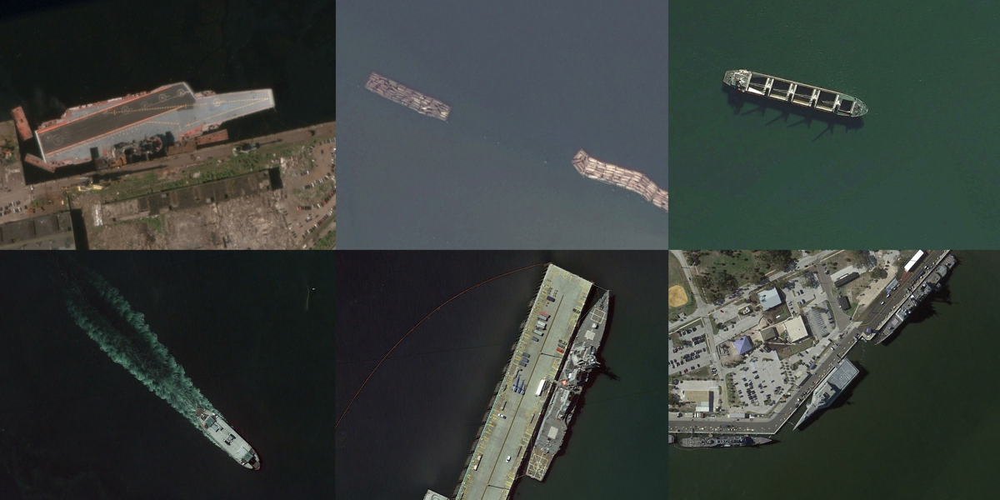

In [2]:
print("Примеры оригинальных изображений")
Image.open("./appendix/initial.jpg").resize([1200, 600])

## DDPM

**DDPM** (Denoising Diffusion Probabilistic Model) — это класс генеративных моделей, представленных в работе  
*"Denoising Diffusion Probabilistic Models"*, Jonathan Ho et al., 2020.  
Данная модель стала основой для целого семейства диффузионных методов, использующих стохастический процесс обратимого зашумления/восстановления для генерации новых изображений.  

---

**Прямой (задающий) процесс**  
- Постепенное добавление гауссовского шума к изображению в течение нескольких шагов, пока оно не превратится в почти чистый шум.

**Обратный (восстанавливающий) процесс**  
- Модель обучается выполнять обратное преобразование — то есть поэтапно удалять шум и восстанавливать изображение на каждом шаге.

**Генерация изображений**  
- В процессе генерации всё начинается с случайного шума. Модель шаг за шагом "очищает" его, восстанавливая структуру, что в итоге приводит к формированию реалистичного изображения.

---

<img src="./appendix/ddpm.png" alt="Процесс диффузии" width="1000"/>

Примеры изображений, синтезированных DDPM


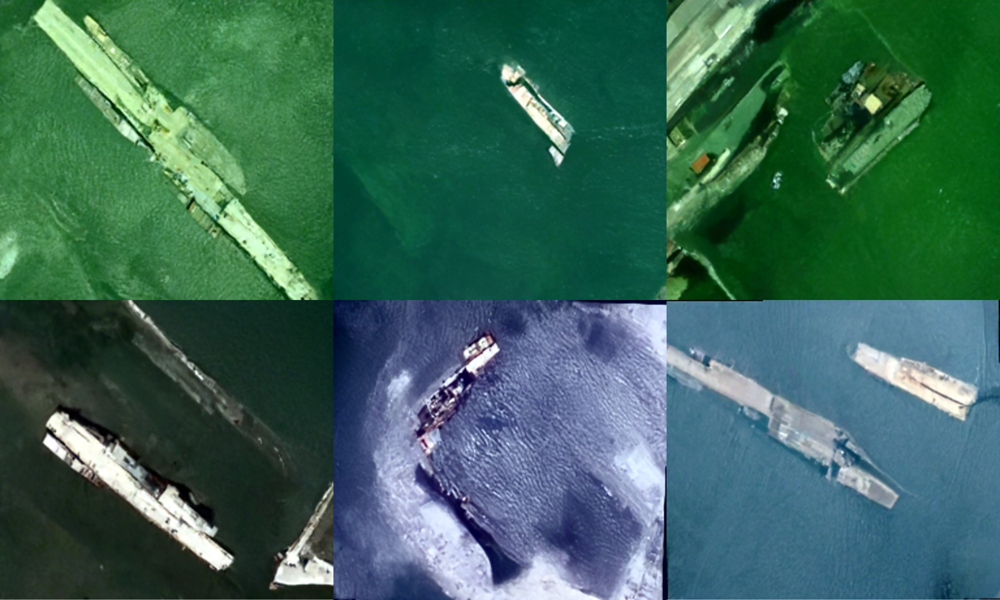

In [3]:
print("Примеры изображений, синтезированных DDPM")
Image.open("./appendix/ddpm.jpg").resize([1000, 600])

## ImageVariation

Метод **Stable Diffusion ImageVariation** позволяет генерировать вариации исходного изображения *без использования текстовых подсказок*. Он предназначен для создания визуально похожих, но уникальных изображений на основе заданного образца.

---

**Извлечение признаков из изображения**

- Используется модель *CLIP*, которая преобразует изображение в эмбеддинг, отражающий его визуальное содержание.
- Этот эмбеддинг затем служит *условием* (conditioning vector) для диффузионной модели — аналогично тому, как используется текстовый промпт в классической генерации через Stable Diffusion.

**Диффузионный процесс в латентном пространстве**

- Stable Diffusion использует *латентное представление* изображения:  
  Исходное изображение кодируется через *энкодер* в компактное латентное пространство.
  
- К этому латентному представлению добавляется шум, после чего модель *UNet* поэтапно удаляет шум, учитывая при этом эмбеддинг из CLIP.  
  Это позволяет сохранять стилистику и структуру оригинального изображения.

**Восстановление изображения**

- После завершения процесса денойзинга формируется финальное латентное представление.
- *Декодер* преобразует его обратно в изображение в пиксельном пространстве.

---

Примеры изображений, синтезированных ImageVariation


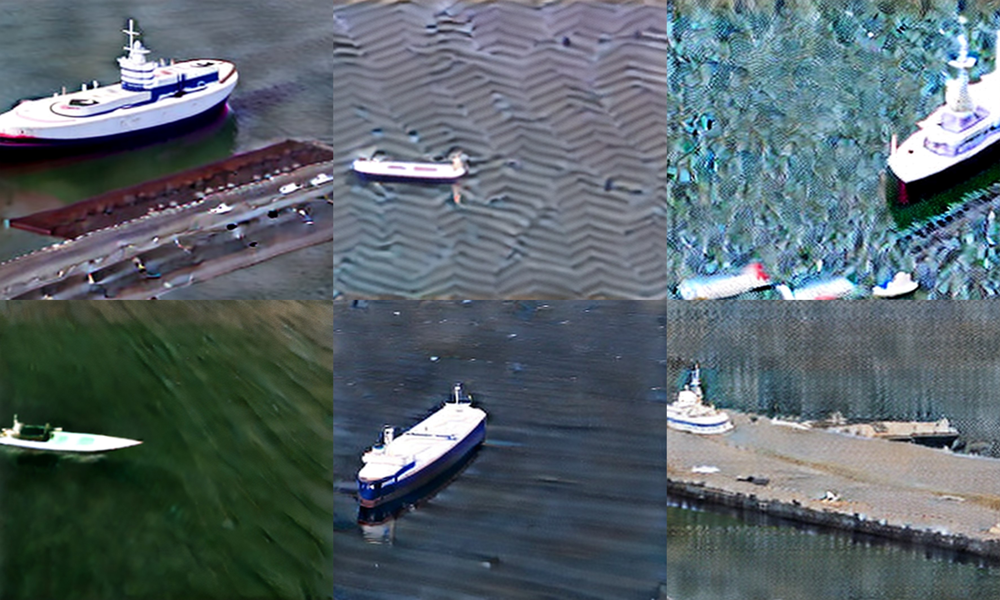

In [4]:
print("Примеры изображений, синтезированных ImageVariation")
Image.open("./appendix/image_variation.jpg").resize([1000, 600])

## Img2Img

Метод **Stable Diffusion Img2Img** позволяет *трансформировать* исходное изображение под влиянием *текстовой инструкции*. Он эффективно объединяет визуальный образ и текстовое условие, создавая "перерисованную" версию исходника с заданной степенью изменения.

---

**Преобразование изображения в латентное пространство**

- Исходное изображение кодируется с помощью *энкодера*, преобразуясь в латентное представление (latent vector), с которым далее работает диффузионная модель.

**Добавление шума и настройка степени вмешательства**

- К латенту добавляется *гауссовский шум*.  
- Параметр `strength` управляет уровнем шума и, соответственно, *степенью отклонения от оригинала*:
  - Низкое значение → больше деталей оригинала сохраняется.
  - Высокое значение → изображение сильнее подстраивается под текст.

**Денойзинг с учётом текстовой подсказки**

- Диффузионная модель (*UNet*) пошагово устраняет шум, ориентируясь на:
  - *Текущий латент* (обновляющийся на каждом шаге);
  - *Текстовый эмбеддинг*, извлечённый через *CLIP-трансформер*.
- Таким образом, генерируемое изображение *следует содержанию текстовой подсказки*, сохраняя общую структуру исходного образа.

**Декодирование результата**

- После завершения процесса денойзинга полученный латент преобразуется в изображение с помощью *декодера*, формируя финальный результат.

---

<img src="./appendix/img2img.png" alt="Процесс диффузии" width="1000"/>

Примеры изображений, синтезированных Img2Img


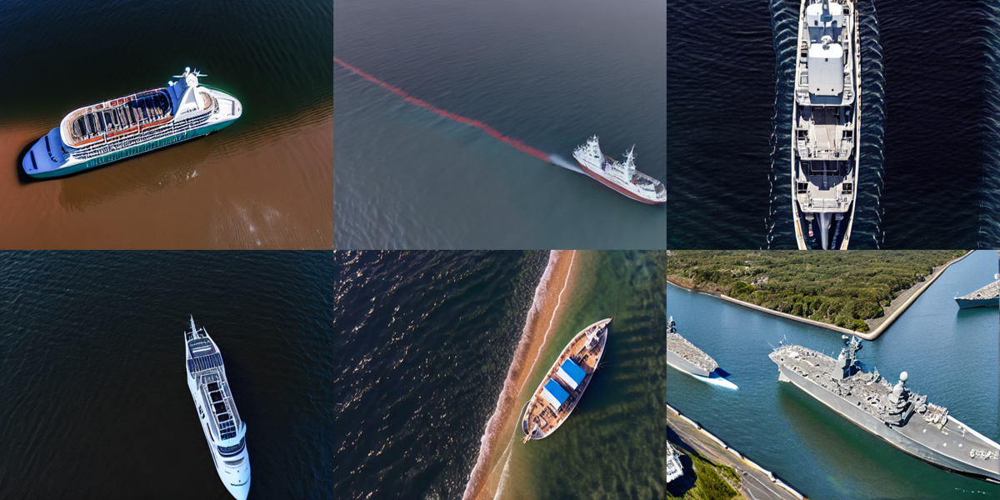

In [5]:
print("Примеры изображений, синтезированных Img2Img")
Image.open("./appendix/img2img.jpg").resize([1200, 600])

## Pix2Pix

**Stable Diffusion Pix2Pix** — это модифицированная модель, специально дообученная для задачи *редактирования изображений по текстовому описанию*.  
В отличие от стандартных генеративных моделей, InstructPix2Pix обучалась на парах изображений *«до / после»*, сопровождаемых *текстовой инструкцией*, описывающей требуемые изменения.

---

**Обработка входных данных**

- *Изображение* кодируется в латентное пространство с помощью *энкодера*, затем к латенту добавляется шум, чтобы инициировать диффузионный процесс.
- *Текстовая команда* кодируется через *текстовый энкодер* на базе *CLIP*.

**Управляемый денойзинг**

- Диффузионная модель (*UNet*), дообученная именно на задаче *редактирования*, способна:
  - локализовать изменения,
  - применять модификации *только к релевантным областям изображения*, не нарушая остальную структуру.
- Это позволяет добиваться высокой точности редактирования, особенно в сложных сценах.

**Реконструкция изображения**

- После завершения процесса денойзинга, очищенный латент передаётся на *декодер*, который восстанавливает итоговое изображение в пиксельном пространстве.

---

<img src="./appendix/pix2pix.png" alt="Процесс диффузии" width="1000"/>

Примеры изображений, синтезированных Pix2Pix


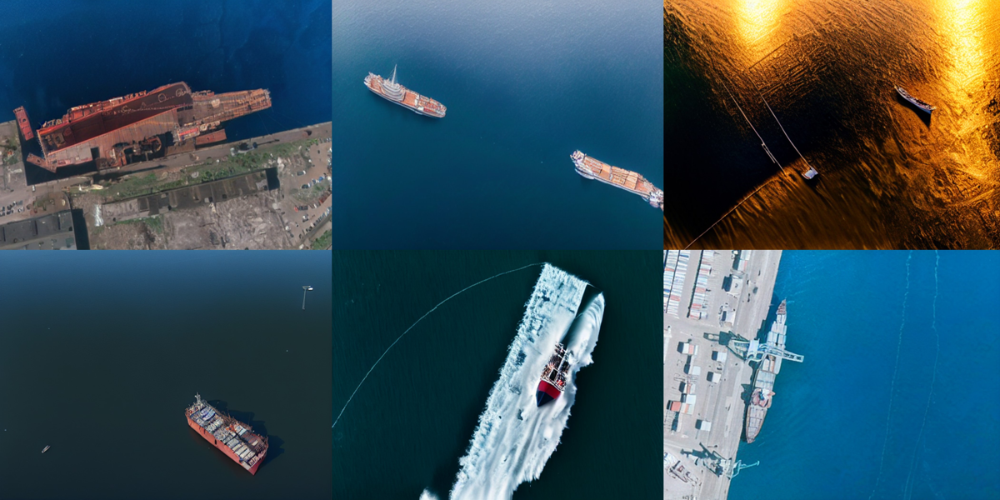

In [6]:
print("Примеры изображений, синтезированных Pix2Pix")
Image.open("./appendix/pix2pix.jpg").resize([1200, 600])

# Baseline

Было проведено обучение модели **YOLOv11s** на **исходном датасете** без включения синтетически сгенерированных данных. Цель — получить базовую модель, на которую в дальнейшем можно будет опираться при сравнении с улучшениями, полученными за счёт синтетического расширения.

---

**Параметры обучения**:

- *Предобученные веса:* COCO
- *Размер входного изображения:* 640х640
- *Количество эпох:* 1000
- *Размер батча:* 32
- *Начальная скорость обучения:* 0.001
- *Оптимизатор:* Adam
- *Аугментации:* применён набор базовых техник аугментации для повышения обобщающей способности модели  

**Аналогично обучались модели на смеси оригинальных и синтетических данных**

---

История обучения Baseline модели


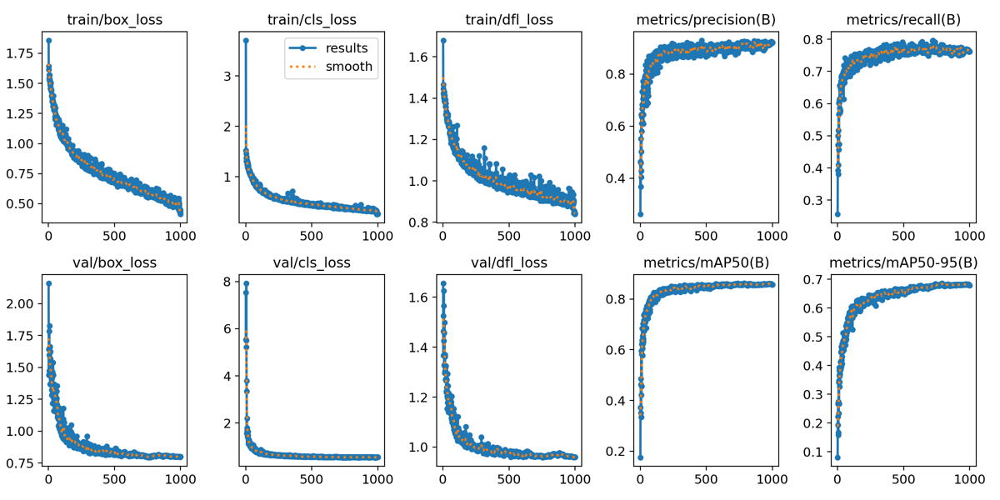

In [7]:
print("История обучения Baseline модели")
Image.open("./runs/baseline/ship_detection/results.png").resize([1200, 600])

Проверим метрики на тестовом наборе данных.

In [8]:
baseline_model = YOLO("./runs/baseline/ship_detection/weights/best.pt")
baseline_results = baseline_model.val(
    data="./dataset_baseline.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/baseline/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:06<00:00,  6.33it/s]


                   all        610       3249      0.814      0.555      0.686      0.506
Speed: 0.5ms preprocess, 4.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs\baseline\test\ship_detection


Отобразим матрицу ошибок модели на тестовом наборе данных.

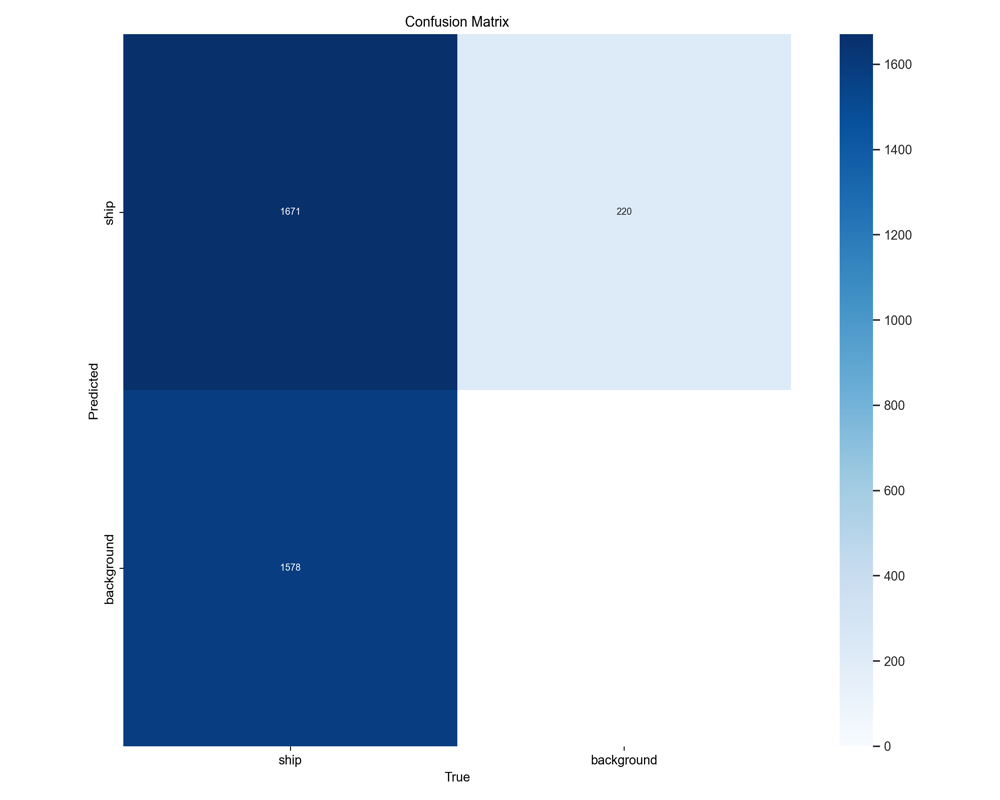

In [9]:
Image.open("./runs/baseline/test/ship_detection/confusion_matrix.png").resize(
    [1000, 800]
)

- Модель характеризуется высокой долей ложноотрицательных ответов, попробуем исправить это путем добавления синтетических данных.

# Авторазметка YOLO

Синтетически сгенерированные изображения проходили постобработку с целью отбора наиболее качественных для последующего обучения. Для этого применялась *авторазметка* с помощью базовой модели детекции (**YOLOv11s**), обученной на реальных данных.

---

**Этапы отбора и фильтрации**:

- Получение предсказаний  
  Каждое синтетическое изображение обрабатывалось базовой моделью YOLO для получения предсказанных *bounding box-ов (bbox)*.

- Фильтрация по confidence  
  Изображения с *средним confidence ниже 0.5* по всем bbox-ам отбрасывались как ненадёжные.

- Удаление ложных срабатываний (галлюцинаций)  
  Исключались случаи, где модель детектировала корабли, *визуально отсутствующие* на изображении.

- Баланс объёма данных  
  Общее число отобранных синтетических изображений приводилось к *соразмерному количеству* с оригинальным датасетом, чтобы избежать доминирования синтетики в обучении.

---

Примеры размеченных изображений


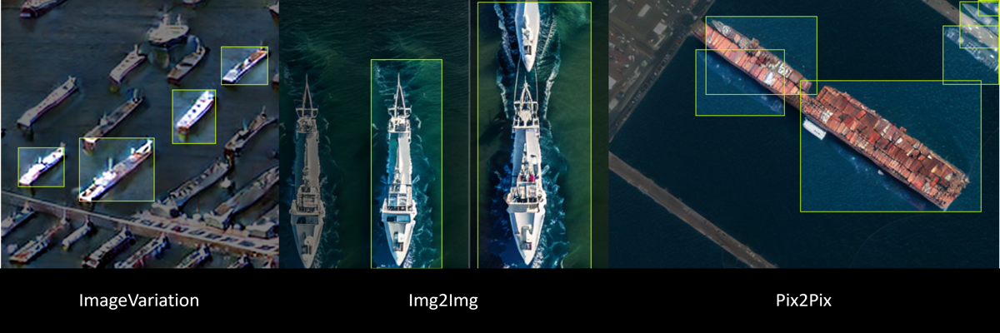

In [10]:
print("Примеры размеченных изображений")
Image.open("./appendix/autolabeling_yolo.png").resize([1200, 400])

## ImageVariation + YOLO

In [11]:
image_variation_yolo_model = YOLO(
    "./runs/image_variation_yolo/ship_detection/weights/best.pt"
)
image_variation_yolo_results = image_variation_yolo_model.val(
    data="./dataset_image_variation_yolo.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/image_variation_yolo/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.87it/s]


                   all        610       3249      0.773      0.567       0.67      0.483
Speed: 0.4ms preprocess, 4.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\image_variation_yolo\test\ship_detection


## Img2Img + YOLO

In [12]:
img2img_yolo_model = YOLO("./runs/img2img_yolo/ship_detection/weights/best.pt")
img2img_yolo_results = img2img_yolo_model.val(
    data="./dataset_img2img_yolo.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/img2img_yolo/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.05it/s]


                   all        610       3249      0.786      0.563      0.687      0.499
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs\img2img_yolo\test\ship_detection


## Pix2Pix + YOLO

In [13]:
pix2pix_yolo_model = YOLO("./runs/pix2pix_yolo/ship_detection/weights/best.pt")
pix2pix_yolo_results = pix2pix_yolo_model.val(
    data="./dataset_pix2pix_yolo.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/pix2pix_yolo/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.16it/s]


                   all        610       3249      0.808      0.552      0.686      0.495
Speed: 0.4ms preprocess, 3.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\pix2pix_yolo\test\ship_detection


- Можно видеть, что по сравнению с исходной моделью качество детекции либо снизилось, либо осталось на прежнем уровне. Вероятно, это связано с ошибками и неточностями в разметке данных.

# Авторазметка DINO

Для разметки синтетически сгенерированных изображений использовалась модель **GroundingDINO**, способная выполнять детекцию объектов на основе текстового описания.  
В качестве текстового промпта применялась фраза: *"a ship"*.

---

**Этапы отбора и фильтрации:**

- Детекция объектов  
  Все синтетические изображения обрабатывались детектором GroundingDINO для извлечения *bounding box-ов* на основе заданного текстового запроса.

- Фильтрация по confidence  
  Изображения, в которых *средний confidence предсказанных bbox-ов был ниже 0.5*, исключались из дальнейшего использования.

- Удаление визуально ошибочных предсказаний (галлюцинаций)  
  Исключались изображения, на которых модель детектировала корабли, *визуально отсутствующие* на изображении.

- Сбалансированность выборки  
  Итоговое число синтетических изображений приводилось в *соответствие с объёмом оригинального датасета*, чтобы сохранить баланс при обучении.

---

Примеры размеченных изображений


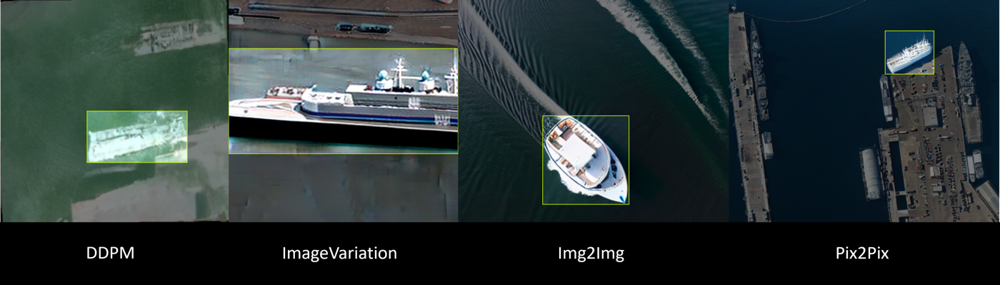

In [14]:
print("Примеры размеченных изображений")
Image.open("./appendix/autolabeling_dino.png").resize([1400, 400])

## DDPM + DINO

In [15]:
ddpm_dino_model = YOLO("./runs/ddpm_dino/ship_detection/weights/best.pt")
ddpm_dino_results = ddpm_dino_model.val(
    data="./dataset_ddpm_dino.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/ddpm_dino/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.83it/s]


                   all        610       3249      0.798      0.592      0.712      0.522
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\ddpm_dino\test\ship_detection


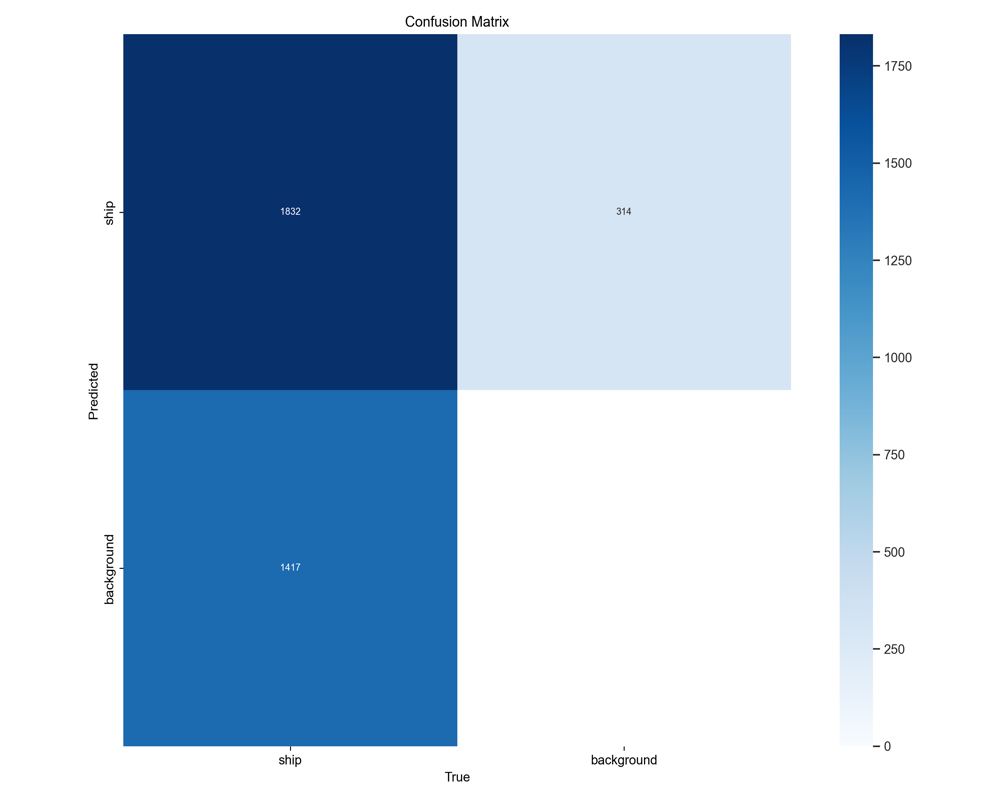

In [16]:
Image.open("./runs/ddpm_dino/test/ship_detection/confusion_matrix.png").resize(
    [1000, 800]
)

- Снизилось количество ложноотрицательных ответов по сравнению с Baseline моделью.

## ImageVariation + DINO

In [17]:
image_variation_dino_model = YOLO(
    "./runs/image_variation_dino/ship_detection/weights/best.pt"
)
image_variation_dino_results = image_variation_dino_model.val(
    data="./dataset_image_variation_dino.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/image_variation_dino/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.86it/s]


                   all        610       3249      0.787      0.566      0.686      0.499
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\image_variation_dino\test\ship_detection


## Img2Img + DINO

In [18]:
img2img_dino_model = YOLO("./runs/img2img_dino/ship_detection/weights/best.pt")
img2img_dino_results = img2img_dino_model.val(
    data="./dataset_img2img_dino.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/img2img_dino/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.87it/s]


                   all        610       3249      0.817      0.594      0.713      0.523
Speed: 0.4ms preprocess, 4.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\img2img_dino\test\ship_detection


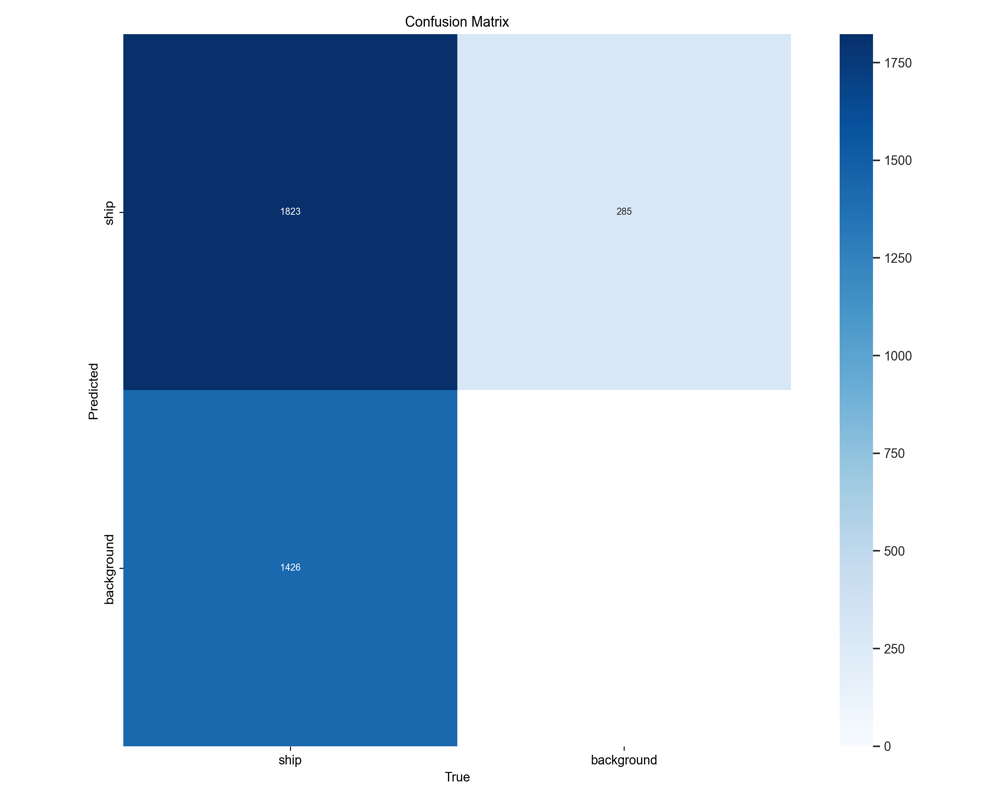

In [19]:
Image.open("./runs/img2img_dino/test/ship_detection/confusion_matrix.png").resize(
    [1000, 800]
)

- Можно видеть снижение количества ложноотрицательных ответов по сравнению с Baseline моделью.

### Img2Img + DINO (fine tune)

Обучение модели с уменьшинным значением скорости обучения (lr=0.0001) на исходных данных без дополнения синтетических.

In [20]:
img2img_dino_ft_model = YOLO("./runs/img2img_dino_ft/ship_detection/weights/best.pt")
img2img_dino_ft_results = img2img_dino_ft_model.val(
    data="./dataset_baseline.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/img2img_dino_ft/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.84it/s]


                   all        610       3249      0.826      0.543      0.681      0.497
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\img2img_dino_ft\test\ship_detection


- Дообучение привело к ухудшению метрик.

## Pix2Pix + DINO

In [21]:
pix2pix_dino_model = YOLO("./runs/pix2pix_dino/ship_detection/weights/best.pt")
pix2pix_dino_results = pix2pix_dino_model.val(
    data="./dataset_pix2pix_dino.yaml",
    split="test",
    imgsz=640,
    batch=16,
    augment=False,
    project="./runs/pix2pix_dino/test",
    name="ship_detection",
    exist_ok=True,
)

Ultralytics 8.3.94  Python-3.13.0 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 16380MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


val: Scanning C:\Users\ivana\SyntheticDataForDetection\dataset\test\labels.cache... 610 images, 13 backgrounds, 0 corrupt: 100%|██████████| 610/610 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.81it/s]


                   all        610       3249       0.81      0.543      0.676       0.49
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\pix2pix_dino\test\ship_detection


- Удалось увеличить метрики модели с помощью синтетических данных, сгенерированных моделями Img2Img и DDPM, а также авторазметки, полученной благодоря DINO. В этом случае произошло увеличение TP и снижение FN ответов.

# Сравнение результатов

In [22]:
models_results = pd.DataFrame(
    {
        "model": [
            "Baseline",
            "ImageVariation+YOLO",
            "Img2Img+YOLO",
            "Pix2Pix+YOLO",
            "DDPM+DINO",
            "ImageVariation+DINO",
            "Img2Img+DINO",
            "Img2Img+DINO FT",
            "Pix2Pix+DINO",
        ],
        "mAP50": [
            baseline_results.box.map50,
            image_variation_yolo_results.box.map50,
            img2img_yolo_results.box.map50,
            pix2pix_yolo_results.box.map50,
            ddpm_dino_results.box.map50,
            image_variation_dino_results.box.map50,
            img2img_dino_results.box.map50,
            img2img_dino_ft_results.box.map50,
            pix2pix_dino_results.box.map50,
        ],
        "mAP50-95": [
            baseline_results.box.map,
            image_variation_yolo_results.box.map,
            img2img_yolo_results.box.map,
            pix2pix_yolo_results.box.map,
            ddpm_dino_results.box.map,
            image_variation_dino_results.box.map,
            img2img_dino_results.box.map,
            img2img_dino_ft_results.box.map,
            pix2pix_dino_results.box.map,
        ],
    }
)

models_results["mAP50"] = models_results["mAP50"].round(3)
models_results["mAP50-95"] = models_results["mAP50-95"].round(3)
models_results = models_results.sort_values(by="mAP50-95", ascending=False)

print(models_results)

                 model  mAP50  mAP50-95
6         Img2Img+DINO  0.713     0.523
4            DDPM+DINO  0.712     0.522
0             Baseline  0.686     0.506
5  ImageVariation+DINO  0.686     0.499
2         Img2Img+YOLO  0.687     0.499
7      Img2Img+DINO FT  0.681     0.497
3         Pix2Pix+YOLO  0.686     0.495
8         Pix2Pix+DINO  0.676     0.490
1  ImageVariation+YOLO  0.670     0.483


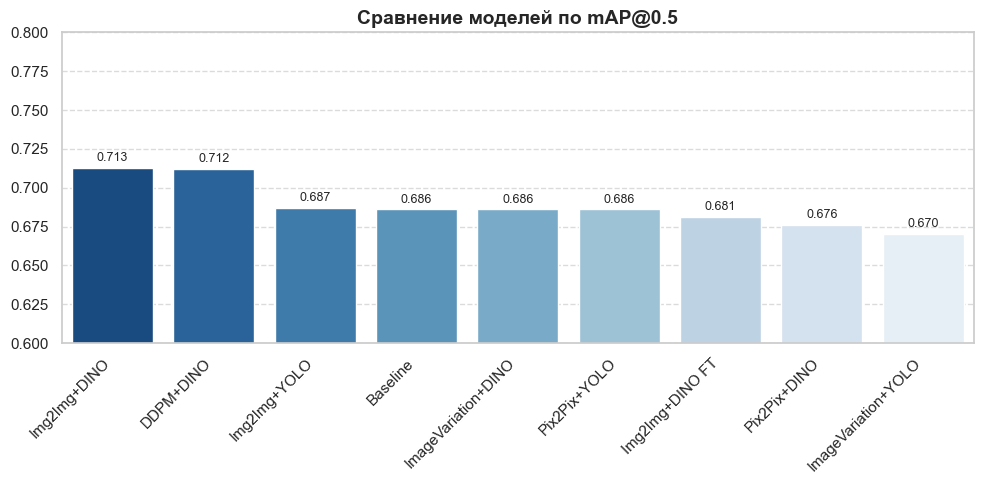

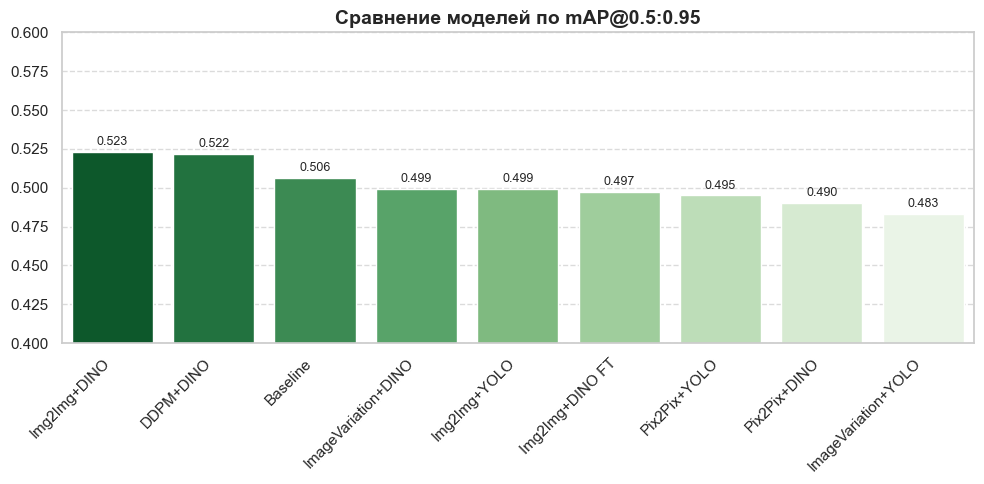

In [23]:
%matplotlib inline
sns.set_theme(style="whitegrid")

# График mAP50
sorted_map50 = models_results.sort_values(by="mAP50", ascending=False)

plt.figure(figsize=(10, 5))
bars = sns.barplot(
    x="model", y="mAP50", hue="model",
    data=sorted_map50, 
    palette=sns.color_palette("Blues_r", len(sorted_map50)), 
    legend=False,
)
plt.title("Сравнение моделей по mAP@0.5", fontsize=14, weight="bold")
plt.xticks(rotation=45, ha="right")
plt.ylim(0.6, 0.8)
plt.ylabel("")
plt.xlabel("")
plt.grid(axis="y", linestyle="--", alpha=0.7)

for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(f"{height:.3f}", xy=(bar.get_x() + bar.get_width() / 2, height),
                  xytext=(0, 5), textcoords="offset points", ha="center", fontsize=9)

plt.tight_layout()
plt.show()

# График mAP50-95
sorted_map50_95 = models_results.sort_values(by="mAP50-95", ascending=False)

plt.figure(figsize=(10, 5))
bars2 = sns.barplot(
    x="model", y="mAP50-95", hue="model",
    data=sorted_map50_95, 
    palette=sns.color_palette("Greens_r", len(sorted_map50_95)), 
    legend=False,
)
plt.title("Сравнение моделей по mAP@0.5:0.95", fontsize=14, weight="bold")
plt.xticks(rotation=45, ha="right")
plt.ylim(0.4, 0.6)
plt.ylabel("")
plt.xlabel("")
plt.grid(axis="y", linestyle="--", alpha=0.7)

for bar in bars2.patches:
    height = bar.get_height()
    bars2.annotate(f"{height:.3f}", xy=(bar.get_x() + bar.get_width() / 2, height),
                   xytext=(0, 5), textcoords="offset points", ha="center", fontsize=9)

plt.tight_layout()
plt.show()


# Выводы

- Использование *Stable Diffusion Img2Img* в сочетании с авторазметкой через *GroundingDINO* позволило достичь прироста качества детекции:
  - **+2.7% по mAP@0.5**
  - **+1.7% по mAP@0.5:0.95**  
  Аналогичного прироста удалось добиться при применении *DDPM* для генерации.

- Повышение метрик при использовании *Img2Img* может быть связано с добавлением изображений *высокой детализации*, содержащих визуально отличные, но реалистичные экземпляры объектов.  
  В то же время *DDPM* мог способствовать улучшению метрик за счёт *разнообразия менее детализированных* примеров, повышающих вариативность.

- Авторазметка с использованием *детектора, обученного только на оригинальных данных*, *не дала улучшения* качества — вероятно, из-за некорректных предсказаний на нетипичных синтетических образцах.

- Попытка *дообучения на оригинальных данных* после смешанной фазы обучения (реальные + синтетические) с *малой скоростью обучения* привела к *ухудшению метрик* — возможно, из-за "забывания" синтетической информации.

- Генерация *800 синтетических изображений*, прошедших фильтр по confidence, с последующей авторазметкой занимала около *5 часов* на GPU *RTX 4060Ti 16Gb*. Наиболее *требовательным к вычислительным ресурсам* являлся *процесс обучения модели DDPM* (500 эпох обучения заняли около 24 часов).

---

> ✅ Исследование показало, что **синтетическое расширение датасета — перспективный подход** для повышения качества детекции, особенно при правильной генерации и авторазметке изображений.


## Продолжение работы

- *Ручная валидация или разметка* части синтетических данных для повышения точности обучения.
- *Генерация целевых изображений* на основе слабых мест модели (false negatives, ошибки локализации).
- *Поиск оптимальных параметров Img2Img*: prompt engineering, величина шумового коэффициента.
- *Анализ соотношения синтетика/реальные данные*, при котором достигается максимальный прирост метрик без деградации качества.
- *Проверка статистической значимости* повышения метрик модели при увеличении размера обучающей выборки.